### Importación de datos



In [11]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,"164,300","6,900",16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,5,-74
1,Mesa de comedor,Muebles,"192,300","8,400",18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6,-76
2,Juego de mesa,Juguetes,"209,600","15,900",15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10,-76
3,Microondas,Electrodomésticos,"757,500","41,000",03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3,-77
4,Silla de oficina,Muebles,"335,200","20,200",07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6,-76


In [3]:
#Unir los dataframe
df = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

In [4]:
# Convertir la fecha al tipo datetime
df['Fecha de Compra'] = pd.to_datetime(df['Fecha de Compra'], dayfirst=True)

In [5]:
# Rellenar valores faltantes (si es necesario)
df = df.dropna(subset=['Precio', 'Costo de envío', 'Fecha de Compra'])

#1. Análisis de facturación



In [6]:
# Calcula la facturación total para cada Tienda
facturacion_tienda1 = (tienda['Precio'] + tienda['Costo de envío']).sum()
facturacion_tienda2 = (tienda2['Precio'] + tienda2['Costo de envío']).sum()
facturacion_tienda3 = (tienda3['Precio'] + tienda3['Costo de envío']).sum()
facturacion_tienda4 = (tienda4['Precio'] + tienda4['Costo de envío']).sum()

# Mostrar resultado
facturacion_total = {
    'Tienda 1': facturacion_tienda1,
    'Tienda 2': facturacion_tienda2,
    'Tienda 3': facturacion_tienda3,
    'Tienda 4': facturacion_tienda4
}


resultado = pd.Series(facturacion_total).sort_values(ascending=False)
pd.options.display.float_format = '{:,.0f}'.format
print(resultado)


Tienda 1   1,212,258,300
Tienda 2   1,175,828,600
Tienda 3   1,156,536,200
Tienda 4   1,093,693,100
dtype: float64


Graficar los ingresos por Tienda

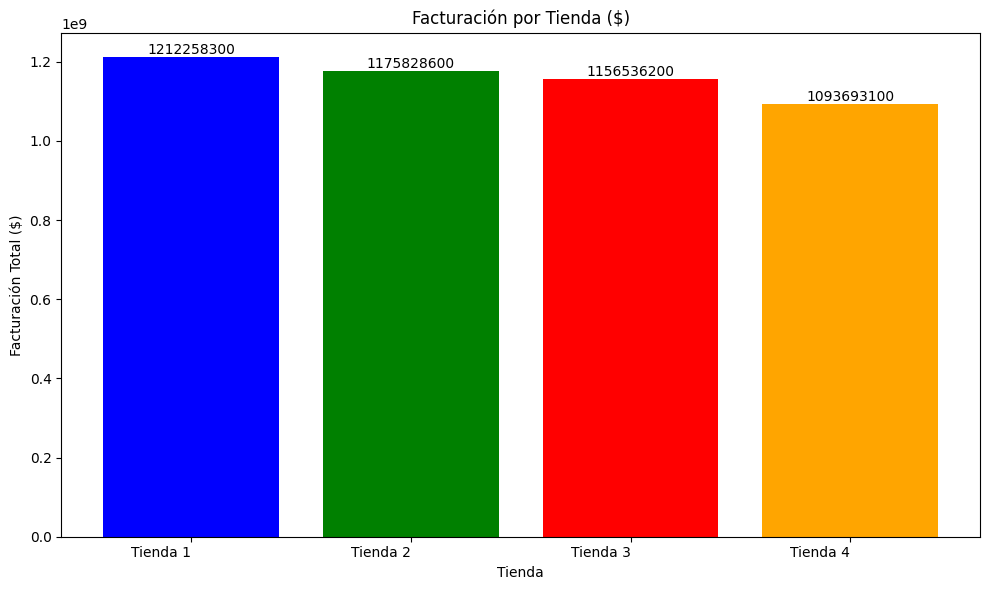

In [35]:
colores = ['blue', 'green', 'red', 'orange']

plt.figure(figsize=(10, 6))
barras = plt.bar(facturacion_total.keys(), facturacion_total.values(), color=colores)

for barra in barras:
    altura = barra.get_height()
    plt.text(barra.get_x() + barra.get_width() / 2, altura,
             f'{altura:.0f}', ha='center', va='bottom')

plt.title('Facturación por Tienda ($)')
plt.xlabel('Tienda')
plt.ylabel('Facturación Total ($)')
plt.xticks(rotation=0, ha='right')
plt.tight_layout()

plt.show()


```
Facturación:
```
---

Si miramos la facturación total por tienda:

**Tienda 1** :  1,150,880,400.  
**Tienda 2** : 1,116,343,500.  
**Tienda 3** : 1,098,019,600.  
**Tienda 4** :  1,038,375,700.  


La **tienda 4** es la que menos ingresos genera y la **Tienda 1** es la que mejores ingresos tiene.

# 2. Ventas por categoría

In [14]:
all_stores = pd.concat([
    tienda.assign(Tienda='Tienda 1'),
    tienda2.assign(Tienda='Tienda 2'),
    tienda3.assign(Tienda='Tienda 3'),
    tienda4.assign(Tienda='Tienda 4')
], ignore_index=True)

category_sales = all_stores.groupby(['Tienda', 'Categoría del Producto'])['Precio'].sum().reset_index()

revenue_table = category_sales.pivot(index='Categoría del Producto', columns='Tienda', values='Precio')

# Calcular el total de ventas por categoría (suma de las filas)
revenue_table['Total por Categoría'] = revenue_table.sum(axis=1)

# Mostrar la tabla con el total por categoría
print("Ingresos por categoría por tienda con total por categoría:")
print(revenue_table)

Ingresos por categoría por tienda con total por categoría:
Tienda                     Tienda 1    Tienda 2    Tienda 3    Tienda 4  \
Categoría del Producto                                                    
Artículos para el hogar  12,698,400  14,746,900  15,060,000  15,074,500   
Deportes y diversión     39,290,000  34,744,500  35,593,100  33,350,100   
Electrodomésticos       363,685,200 348,567,800 329,237,900 283,260,200   
Electrónicos            429,493,500 410,831,100 410,775,800 409,476,100   
Instrumentos musicales   91,299,000 104,990,300  77,380,900  75,102,400   
Juguetes                 17,995,700  15,945,400  19,401,100  20,262,200   
Libros                    8,784,900  10,091,200   9,498,700   9,321,300   
Muebles                 187,633,700 176,426,300 201,072,100 192,528,900   

Tienda                   Total por Categoría  
Categoría del Producto                        
Artículos para el hogar           57,579,800  
Deportes y diversión             142,977,700  
El

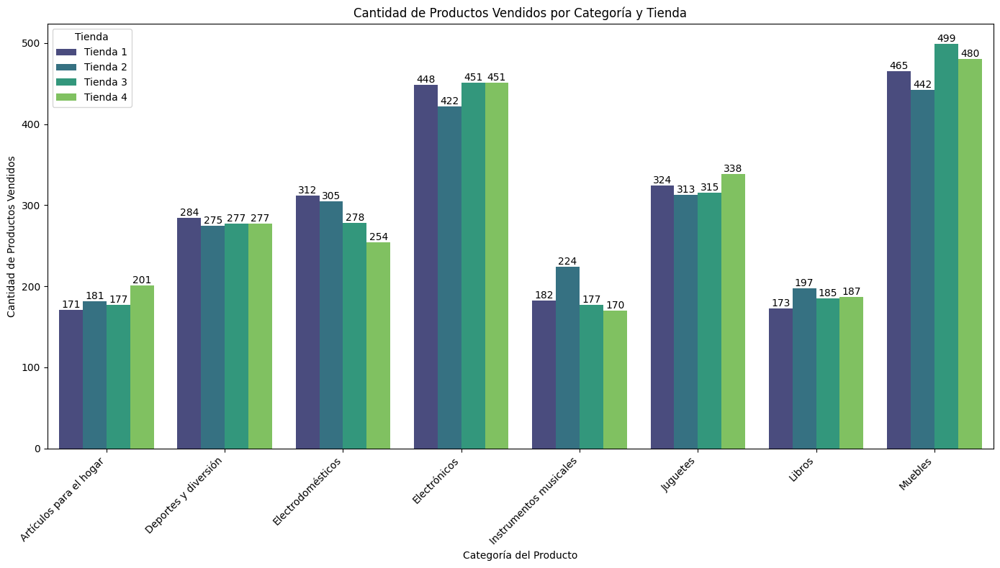

In [15]:


all_stores = pd.concat([
    tienda.assign(Tienda='Tienda 1'),
    tienda2.assign(Tienda='Tienda 2'),
    tienda3.assign(Tienda='Tienda 3'),
    tienda4.assign(Tienda='Tienda 4')
], ignore_index=True)


category_quantity = all_stores.groupby(['Tienda', 'Categoría del Producto'])['Producto'].count().reset_index()
category_quantity = category_quantity.rename(columns={'Producto': 'Cantidad Vendida'})


plt.figure(figsize=(14, 8))


ax = sns.barplot(data=category_quantity,
            x='Categoría del Producto',
            y='Cantidad Vendida',
            hue='Tienda',
            palette='viridis')


for container in ax.containers:
    ax.bar_label(container, fmt='{:,.0f}')


plt.xlabel('Categoría del Producto')
plt.ylabel('Cantidad de Productos Vendidos')
plt.title('Cantidad de Productos Vendidos por Categoría y Tienda')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Tienda')

plt.tight_layout()
plt.show()

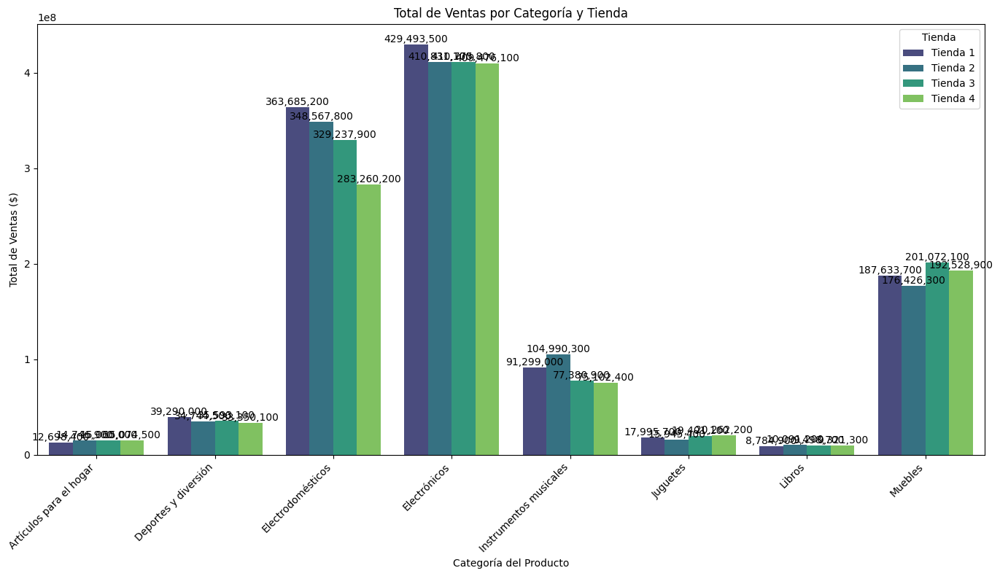

In [16]:
category_sales = all_stores.groupby(['Tienda', 'Categoría del Producto'])['Precio'].sum().reset_index()

plt.figure(figsize=(14, 8))

ax = sns.barplot(data=category_sales,
            x='Categoría del Producto',
            y='Precio',
            hue='Tienda',
            palette='viridis')


for container in ax.containers:
    ax.bar_label(container, fmt='{:,.0f}')

plt.xlabel('Categoría del Producto')
plt.ylabel('Total de Ventas ($)')
plt.title('Total de Ventas por Categoría y Tienda')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Tienda')

plt.tight_layout()
plt.show()

--- Tienda 1 ---

Ventas por categoría:

Ingresos por categoría:
Categoría del Producto
Electrónicos              429,493,500
Electrodomésticos         363,685,200
Muebles                   187,633,700
Instrumentos musicales     91,299,000
Deportes y diversión       39,290,000
Juguetes                   17,995,700
Artículos para el hogar    12,698,400
Libros                      8,784,900
Name: Precio, dtype: float64


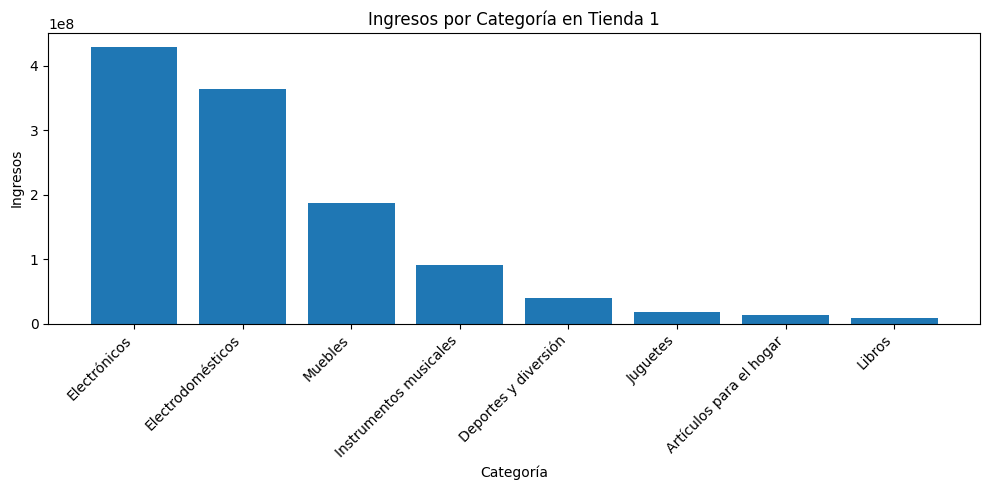

--- Tienda 2 ---

Ventas por categoría:

Ingresos por categoría:
Categoría del Producto
Electrónicos              410,831,100
Electrodomésticos         348,567,800
Muebles                   176,426,300
Instrumentos musicales    104,990,300
Deportes y diversión       34,744,500
Juguetes                   15,945,400
Artículos para el hogar    14,746,900
Libros                     10,091,200
Name: Precio, dtype: float64


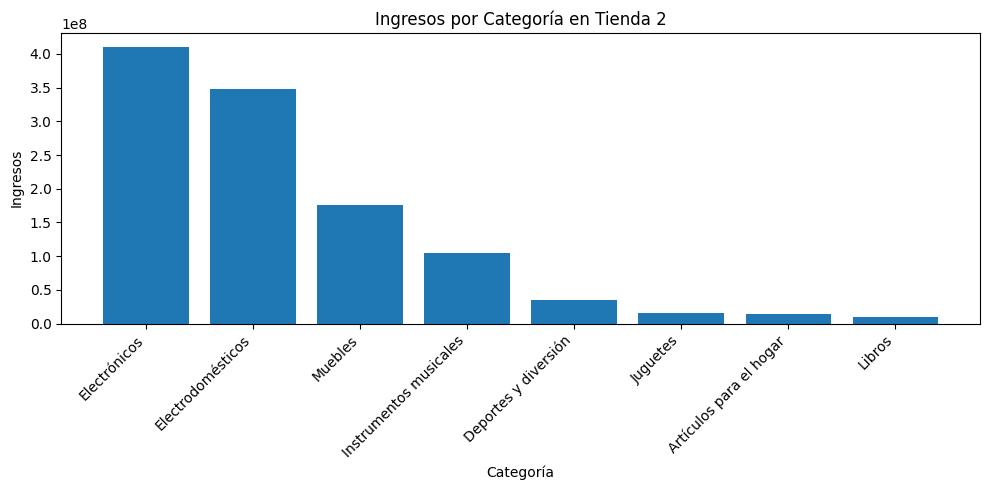

--- Tienda 3 ---

Ventas por categoría:

Ingresos por categoría:
Categoría del Producto
Electrónicos              410,775,800
Electrodomésticos         329,237,900
Muebles                   201,072,100
Instrumentos musicales     77,380,900
Deportes y diversión       35,593,100
Juguetes                   19,401,100
Artículos para el hogar    15,060,000
Libros                      9,498,700
Name: Precio, dtype: float64


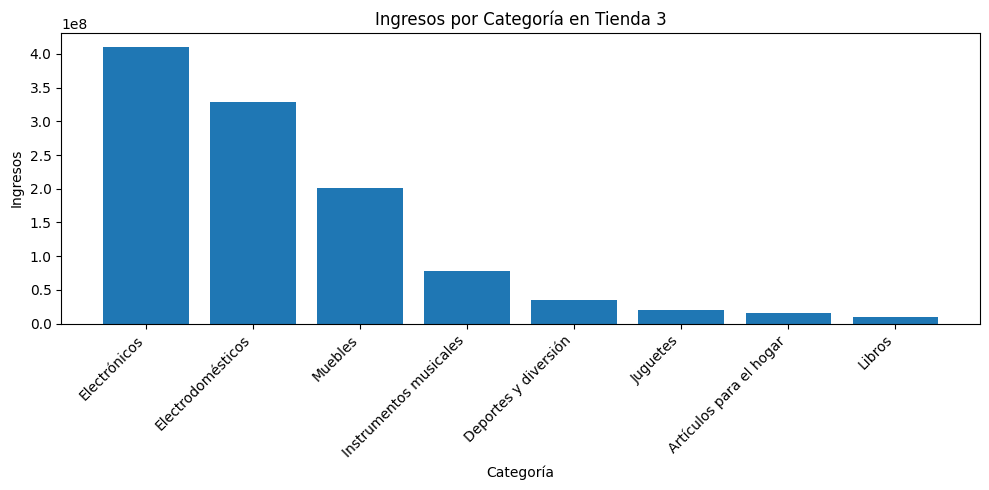

--- Tienda 4 ---

Ventas por categoría:

Ingresos por categoría:
Categoría del Producto
Electrónicos              409,476,100
Electrodomésticos         283,260,200
Muebles                   192,528,900
Instrumentos musicales     75,102,400
Deportes y diversión       33,350,100
Juguetes                   20,262,200
Artículos para el hogar    15,074,500
Libros                      9,321,300
Name: Precio, dtype: float64


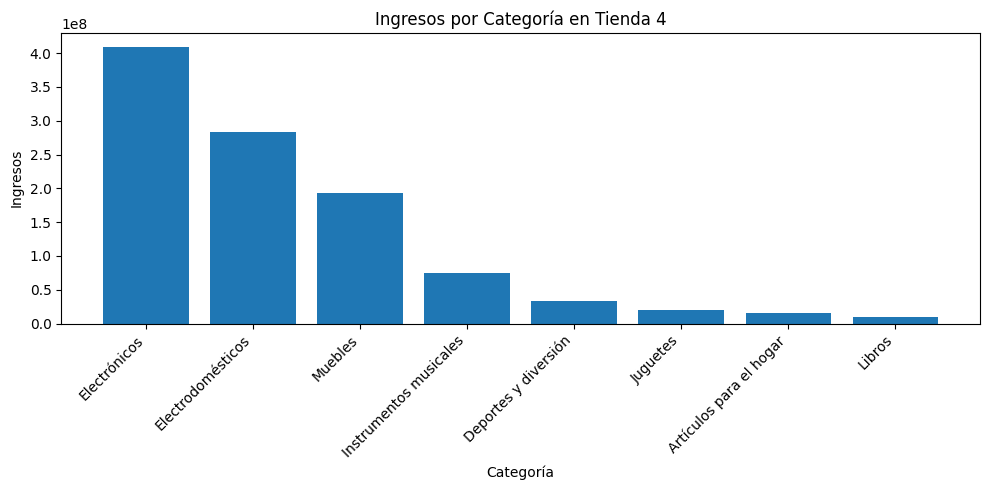

In [17]:

def analizar_tienda(tienda_df, nombre_tienda):
    try:

        # Calcular ingresos por categoría
        ingresos_por_categoria = tienda_df.groupby('Categoría del Producto')['Precio'].sum().sort_values(ascending=False)

    except KeyError:
        print(f"La columna 'Categoría del Producto' no se encuentra en {nombre_tienda}.")

        return

    print(f"--- {nombre_tienda} ---")
    print("\nVentas por categoría:")

    print("\nIngresos por categoría:")
    print(ingresos_por_categoria)


    plt.figure(figsize=(10, 5))
    plt.bar(ingresos_por_categoria.index, ingresos_por_categoria.values)
    plt.title(f"Ingresos por Categoría en {nombre_tienda}")
    plt.xlabel("Categoría")
    plt.ylabel("Ingresos")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


# Analizar cada tienda
analizar_tienda(tienda, "Tienda 1")
analizar_tienda(tienda2, "Tienda 2")
analizar_tienda(tienda3, "Tienda 3")
analizar_tienda(tienda4, "Tienda 4")

In [12]:

all_stores = pd.concat([tienda, tienda2, tienda3, tienda4], ignore_index=True)

sales_by_category = all_stores.groupby('Categoría del Producto')['Precio'].sum().sort_values(ascending=False)

total_sales = sales_by_category.sum()

percentage_contribution = (sales_by_category / total_sales) * 100

print("Ventas totales por categoría:")
print(sales_by_category)
print("\nPorcentaje (%) de contribución por categoría:")
print(percentage_contribution)

Ventas totales por categoría:
Categoría del Producto
Electrónicos              1,660,576,500
Electrodomésticos         1,324,751,100
Muebles                     757,661,000
Instrumentos musicales      348,772,600
Deportes y diversión        142,977,700
Juguetes                     73,604,400
Artículos para el hogar      57,579,800
Libros                       37,696,100
Name: Precio, dtype: float64

Porcentaje (%) de contribución por categoría:
Categoría del Producto
Electrónicos              38
Electrodomésticos         30
Muebles                   17
Instrumentos musicales     8
Deportes y diversión       3
Juguetes                   2
Artículos para el hogar    1
Libros                     1
Name: Precio, dtype: float64


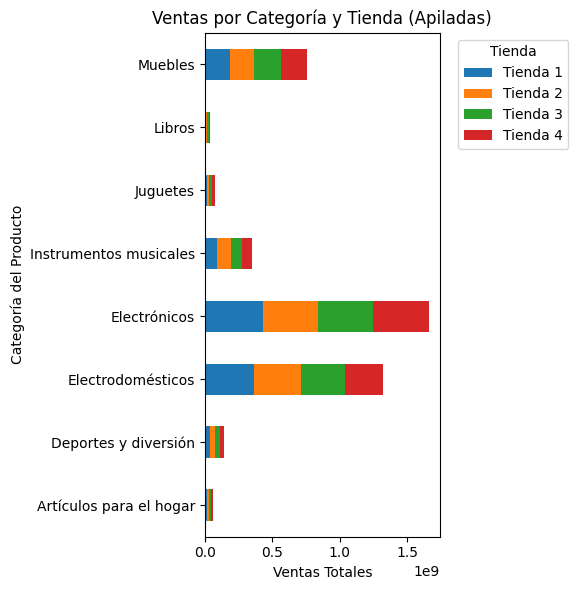

In [36]:
category_sales = all_stores.groupby(['Tienda', 'Categoría del Producto'])['Precio'].sum().reset_index()

revenue_table = category_sales.pivot(index='Categoría del Producto', columns='Tienda', values='Precio')

revenue_table.plot(kind='barh', stacked=True, figsize=(6, 6))
plt.ylabel('Categoría del Producto')
plt.xlabel('Ventas Totales')
plt.title('Ventas por Categoría y Tienda (Apiladas)')
plt.yticks(rotation=0, ha='right')
plt.legend(title='Tienda', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

**Si vemos las categorias que más y menos venden son:**

-Mayores ingresos:
Electrónicos  y Electrodomésticos

-las categorias que generan menos ingresos son:
Libros y Artículos para el hogar

# 3. Calificación promedio de la tienda


In [21]:
# Calcular la calificación promedio de cada tienda
average_ratings = all_stores.groupby('Tienda')['Calificación'].mean()

average_ratings = average_ratings.round(2)

print("Calificación promedio de cada tienda:")
for store, rating in average_ratings.items():
    print(f"{store}: {float(rating)}")


Calificación promedio de cada tienda:
Tienda 1: 3.98
Tienda 2: 4.04
Tienda 3: 4.05
Tienda 4: 4.0


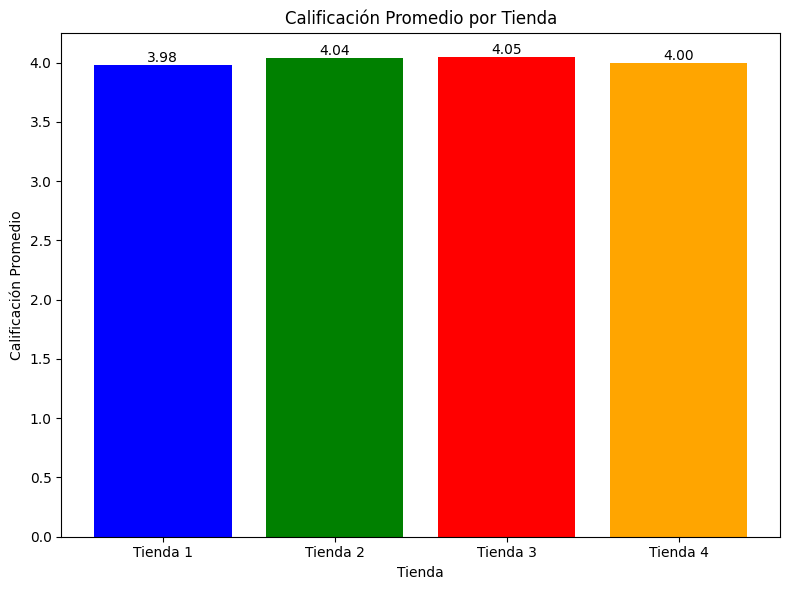

In [22]:
# Calcular la calificación promedio de cada tienda
average_ratings = all_stores.groupby('Tienda')['Calificación'].mean()

plt.figure(figsize=(8, 6))
plt.bar(average_ratings.index, average_ratings.values, color=['blue', 'green', 'red', 'orange'])  # Puedes cambiar los colores

plt.xlabel('Tienda')
plt.ylabel('Calificación Promedio')
plt.title('Calificación Promedio por Tienda')
for i, value in enumerate(average_ratings.values):
    plt.text(i, value, f'{value:.2f}', ha='center', va='bottom')  # Mostrar valores con 2 decimales

plt.tight_layout()
plt.show()

<ipython-input-24-0ab613b632b3>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=overall_seller_ratings,


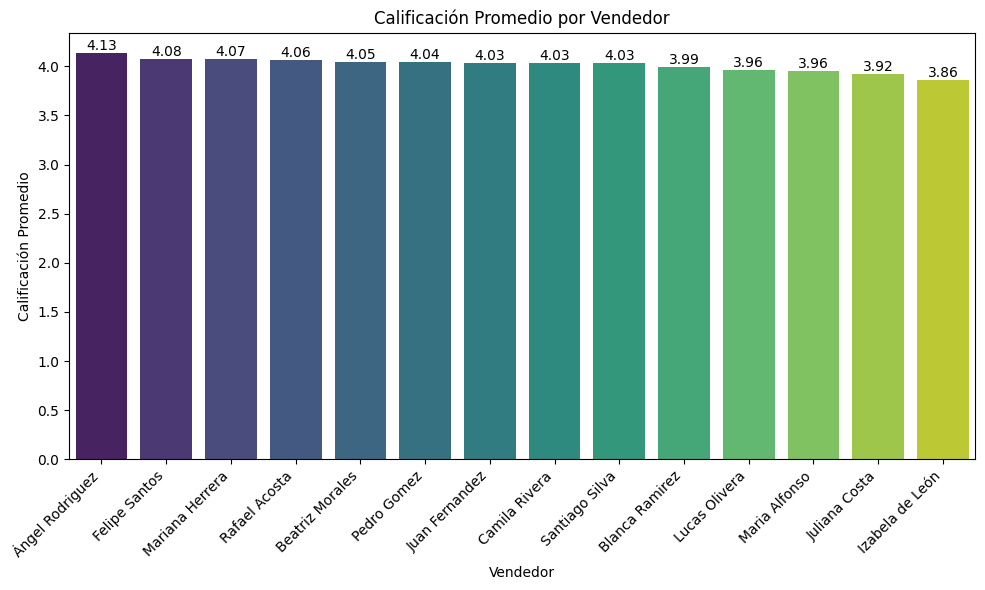

In [24]:
overall_seller_ratings = all_stores.groupby('Vendedor')['Calificación'].mean().reset_index()

overall_seller_ratings = overall_seller_ratings.sort_values(by='Calificación', ascending=False)

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=overall_seller_ratings,
                 x='Vendedor',
                 y='Calificación',
                 palette='viridis')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.xlabel('Vendedor')
plt.ylabel('Calificación Promedio')
plt.title('Calificación Promedio por Vendedor')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability

plt.tight_layout()
plt.show()

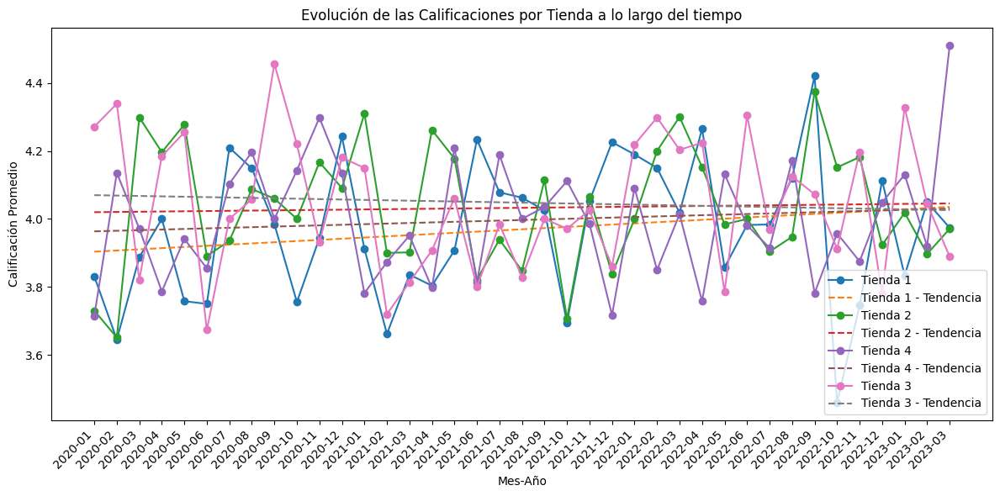

In [24]:

all_stores['Fecha de Compra'] = pd.to_datetime(all_stores['Fecha de Compra'], dayfirst=True, errors='coerce')

# Extraer el mes y año de la fecha de compra
all_stores['Mes-Año'] = all_stores['Fecha de Compra'].dt.to_period('M')

# Agrupar por tienda, mes-año, calcular la calificación promedio
ratings_by_store_month_year = all_stores.groupby(['Tienda', 'Mes-Año'])['Calificación'].mean().reset_index()

ratings_by_store_month_year = ratings_by_store_month_year.sort_values(by=['Mes-Año'])

plt.figure(figsize=(12, 6))

# Iterar sobre las tiendas y graficar cada una
for tienda in ratings_by_store_month_year['Tienda'].unique():
    store_data = ratings_by_store_month_year[ratings_by_store_month_year['Tienda'] == tienda]

    x = np.arange(len(store_data['Mes-Año']))
    y = store_data['Calificación']

    # Calcular la línea de tendencia
    coefficients = np.polyfit(x, y, 1)  # Ajustar una línea (grado 1)
    trend_line = np.polyval(coefficients, x)

    plt.plot(store_data['Mes-Año'].astype(str), store_data['Calificación'], marker='o', label=tienda)
    plt.plot(store_data['Mes-Año'].astype(str), trend_line, '--', label=f'{tienda} - Tendencia')  # Línea discontinua para la tendencia

plt.xlabel('Mes-Año')
plt.ylabel('Calificación Promedio')
plt.title('Evolución de las Calificaciones por Tienda a lo largo del tiempo')
plt.xticks(rotation=45, ha='right')
plt.legend()
plt.tight_layout()
plt.show()

# 4. Productos más y menos vendidos

In [46]:
if 'Ingresos' not in all_stores.columns:
    all_stores['Ingresos'] = all_stores['Precio'] + all_stores['Costo de envío']


top_5_products_by_store_revenue_table = pd.DataFrame()

for store_name, store_df in all_stores.groupby('Tienda'):
    product_revenue = store_df.groupby('Producto')['Ingresos'].sum().reset_index()

    top_5_products_revenue = product_revenue.sort_values(by='Ingresos', ascending=False).head(5)
    top_5_products_revenue['Tienda'] = store_name
    top_5_products_by_store_revenue_table = pd.concat([top_5_products_by_store_revenue_table, top_5_products_revenue], ignore_index=True)

top_5_products_by_store_revenue_table = top_5_products_by_store_revenue_table[['Tienda', 'Producto', 'Ingresos']]

top_5_products_by_store_revenue_table['Ingresos'] = top_5_products_by_store_revenue_table['Ingresos'].apply(lambda x: f'{x:,.0f}')


print("Los 5 productos con mayores ingresos por cada tienda:")
print(top_5_products_by_store_revenue_table)

Los 5 productos con mayores ingresos por cada tienda:
      Tienda          Producto     Ingresos
0   Tienda 1     TV LED UHD 4K  142,150,200
1   Tienda 1      Refrigerador  112,143,300
2   Tienda 1         Iphone 15   97,902,200
3   Tienda 1          Smart TV   67,452,100
4   Tienda 1  Lavadora de ropa   65,783,600
5   Tienda 2         Iphone 15  113,225,800
6   Tienda 2     TV LED UHD 4K  103,375,000
7   Tienda 2      Refrigerador   97,632,500
8   Tienda 2  Lavadora de ropa   66,762,300
9   Tienda 2          Smart TV   61,142,000
10  Tienda 3      Refrigerador   99,889,700
11  Tienda 3     TV LED UHD 4K   96,669,100
12  Tienda 3         Iphone 15   93,225,700
13  Tienda 3          Smart TV   78,837,300
14  Tienda 3      Lavavajillas   64,364,800
15  Tienda 4         Iphone 15   96,697,500
16  Tienda 4     TV LED UHD 4K   90,295,300
17  Tienda 4          Smart TV   82,790,400
18  Tienda 4      Refrigerador   75,271,900
19  Tienda 4       Tablet ABXY   56,723,100


In [25]:

def get_top_products_by_store(all_stores, top_n=5):

    top_products_by_store = {}
    for store, group in all_stores.groupby('Tienda'):
        product_sales = group.groupby('Producto')['Producto'].count().reset_index(name='Cantidad Vendida')
        product_sales = product_sales.rename(columns={'Producto': 'Nombre del producto'})

        product_sales = product_sales.sort_values(by='Cantidad Vendida', ascending=False)
        top_products_by_store[store] = product_sales.head(top_n)
    return top_products_by_store

top_products_data = get_top_products_by_store(all_stores, top_n=5)

for store, top_products in top_products_data.items():
    print(f"\nTop 5 Products for {store}:")
    print(top_products)



Top 5 Products for Tienda 1:
   Nombre del producto  Cantidad Vendida
1              Armario                60
48       TV LED UHD 4K                60
33          Microondas                60
40    Secadora de ropa                58
32       Mesa de noche                56

Top 5 Products for Tienda 2:
          Nombre del producto  Cantidad Vendida
24  Iniciando en programación                65
33                 Microondas                62
7                     Batería                61
38                  Pandereta                58
21          Guitarra acústica                58

Top 5 Products for Tienda 3:
   Nombre del producto  Cantidad Vendida
27       Kit de bancas                57
31     Mesa de comedor                56
11           Cama king                56
41        Set de ollas                55
32       Mesa de noche                55

Top 5 Products for Tienda 4:
          Nombre del producto  Cantidad Vendida
10                   Cama box                62
15  


Top 5 Products for Tienda 1:
   Nombre del producto Categoría del Producto  Cantidad Vendida
1              Armario                Muebles                60
48       TV LED UHD 4K           Electrónicos                60
33          Microondas      Electrodomésticos                60
40    Secadora de ropa      Electrodomésticos                58
32       Mesa de noche                Muebles                56

Top 5 Products for Tienda 2:
          Nombre del producto  Categoría del Producto  Cantidad Vendida
24  Iniciando en programación                  Libros                65
33                 Microondas       Electrodomésticos                62
7                     Batería  Instrumentos musicales                61
38                  Pandereta  Instrumentos musicales                58
21          Guitarra acústica  Instrumentos musicales                58

Top 5 Products for Tienda 3:
   Nombre del producto   Categoría del Producto  Cantidad Vendida
27       Kit de bancas      

<ipython-input-31-66a28d292d8f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_products, x='Cantidad Vendida', y='Producto y Categoría', palette='viridis')


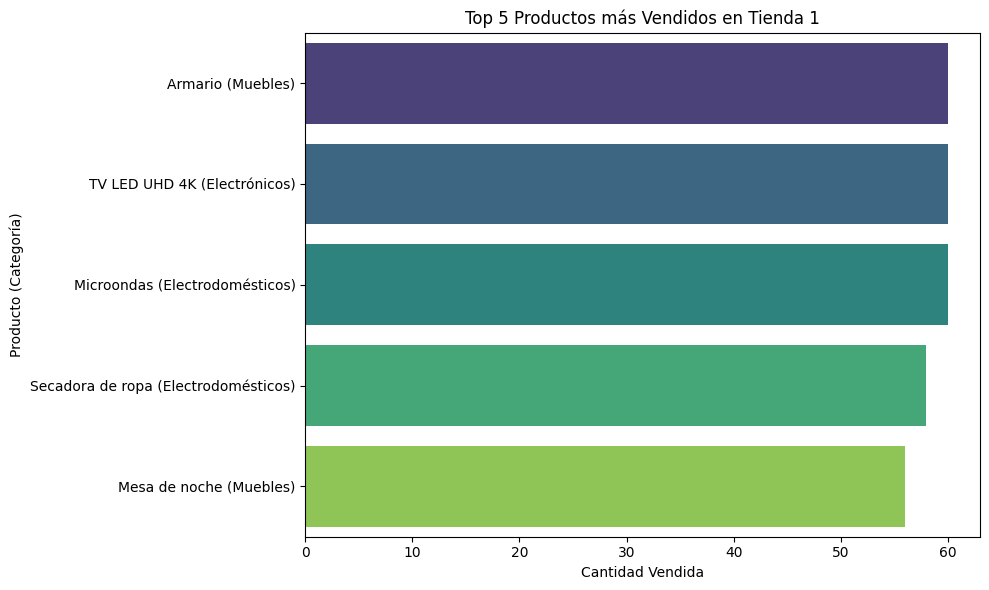

<ipython-input-31-66a28d292d8f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_products, x='Cantidad Vendida', y='Producto y Categoría', palette='viridis')


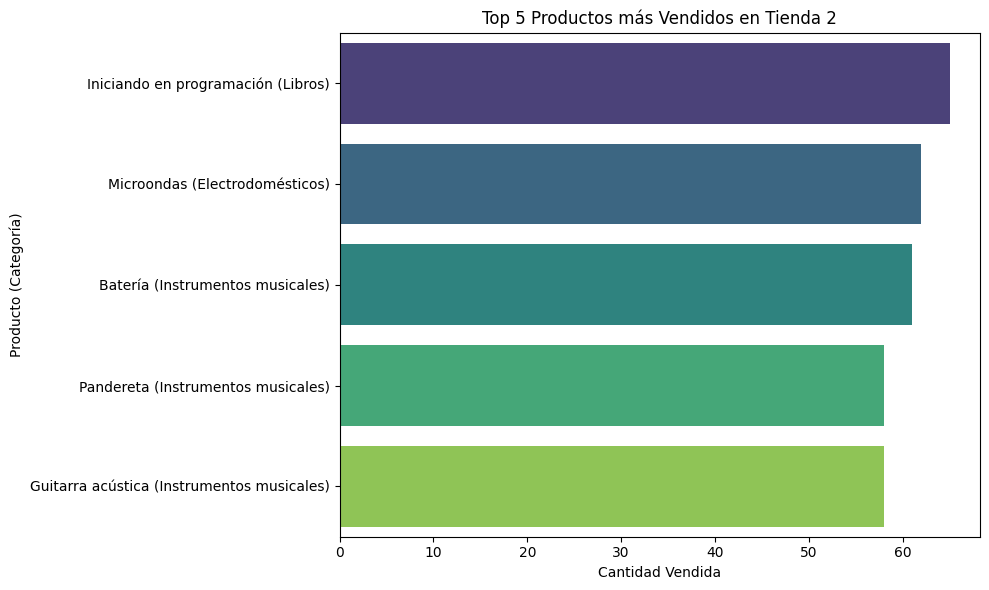

<ipython-input-31-66a28d292d8f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_products, x='Cantidad Vendida', y='Producto y Categoría', palette='viridis')


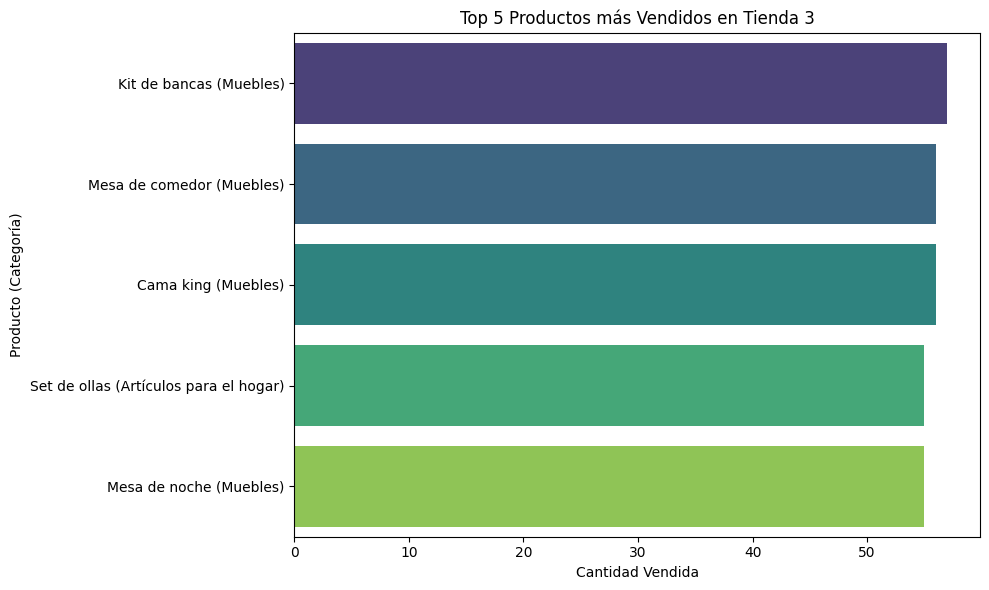

<ipython-input-31-66a28d292d8f>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top_products, x='Cantidad Vendida', y='Producto y Categoría', palette='viridis')


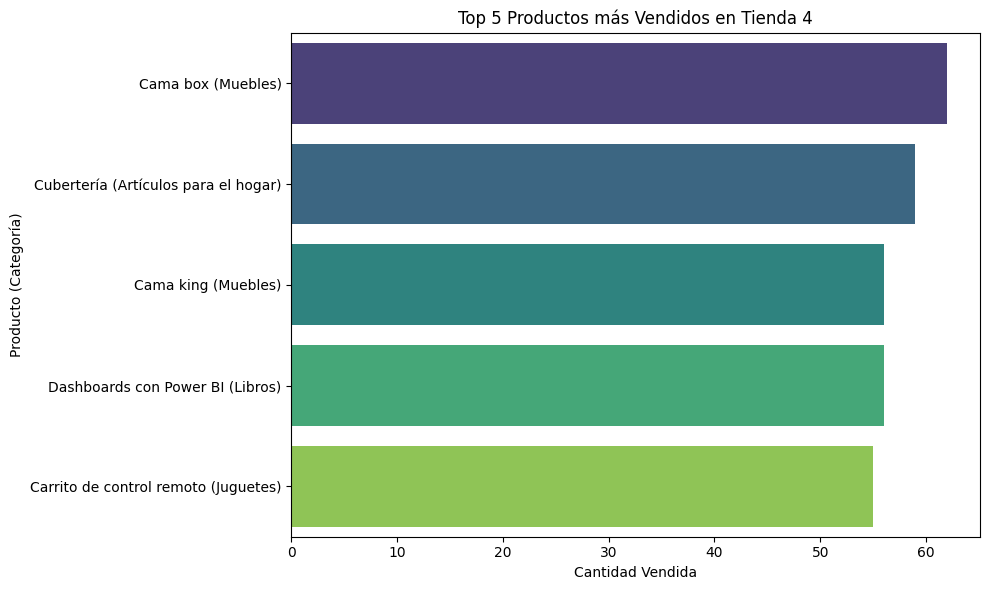

In [31]:
def get_top_products_by_store_with_category(all_stores, top_n=5):

    top_products_by_store = {}
    for store, group in all_stores.groupby('Tienda'):
        product_category_sales = group.groupby(['Producto', 'Categoría del Producto']).size().reset_index(name='Cantidad Vendida')
        product_category_sales = product_category_sales.rename(columns={'Producto': 'Nombre del producto'})

        product_category_sales = product_category_sales.sort_values(by='Cantidad Vendida', ascending=False)
        top_products_by_store[store] = product_category_sales.head(top_n)
    return top_products_by_store

top_products_data_with_category = get_top_products_by_store_with_category(all_stores, top_n=5)

for store, top_products in top_products_data_with_category.items():
    print(f"\nTop 5 Products for {store}:")
    print(top_products)

def plot_top_products_by_store_with_category(top_products_data):

    for store, top_products in top_products_data.items():
        plt.figure(figsize=(10, 6))

        top_products['Producto y Categoría'] = top_products['Nombre del producto'] + ' (' + top_products['Categoría del Producto'] + ')'

        sns.barplot(data=top_products, x='Cantidad Vendida', y='Producto y Categoría', palette='viridis')

        plt.title(f'Top 5 Productos más Vendidos en {store}')
        plt.xlabel('Cantidad Vendida')
        plt.ylabel('Producto (Categoría)')
        plt.tight_layout()
        plt.show()

plot_top_products_by_store_with_category(top_products_data_with_category)

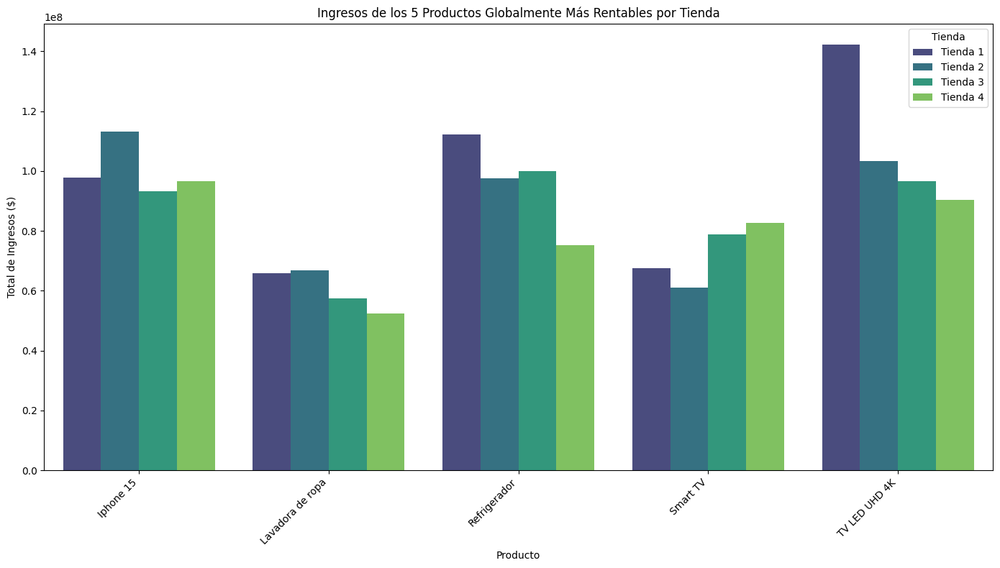

In [45]:

if 'Ingresos' not in all_stores.columns:
    all_stores['Ingresos'] = all_stores['Precio']


global_product_revenue = all_stores.groupby('Producto')['Ingresos'].sum().reset_index()

top_5_global_products = global_product_revenue.sort_values(by='Ingresos', ascending=False).head(5)['Producto'].tolist()


filtered_stores_for_top_products = all_stores[all_stores['Producto'].isin(top_5_global_products)].copy()


revenue_of_top_products_by_store = filtered_stores_for_top_products.groupby(['Tienda', 'Producto'])['Ingresos'].sum().reset_index()


plt.figure(figsize=(14, 8))

ax = sns.barplot(data=revenue_of_top_products_by_store,
                 x='Producto',
                 y='Ingresos',
                 hue='Tienda',
                 palette='viridis')



plt.xlabel('Producto')
plt.ylabel('Total de Ingresos ($)')
plt.title('Ingresos de los 5 Productos Globalmente Más Rentables por Tienda')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Tienda')

plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

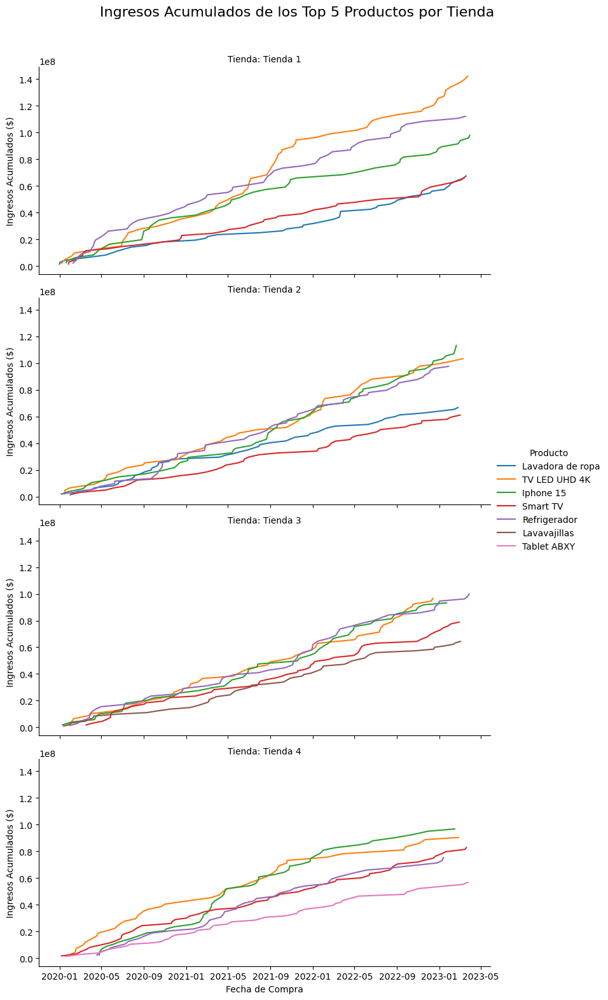

In [38]:
all_stores['Ingresos'] = all_stores['Precio']


top_products_by_store_revenue = pd.DataFrame()

for store_name, store_df in all_stores.groupby('Tienda'):

    product_revenue = store_df.groupby('Producto')['Ingresos'].sum().reset_index()
    top_5_products = product_revenue.sort_values(by='Ingresos', ascending=False).head(5)
    top_5_products['Tienda'] = store_name
    top_products_by_store_revenue = pd.concat([top_products_by_store_revenue, top_5_products], ignore_index=True)


all_stores['Fecha de Compra'] = pd.to_datetime(all_stores['Fecha de Compra'], dayfirst=True, errors='coerce')

all_stores.dropna(subset=['Fecha de Compra'], inplace=True)

all_stores.sort_values(by='Fecha de Compra', inplace=True)


filtered_stores_for_cumulative = pd.DataFrame()

for store_name, store_df in all_stores.groupby('Tienda'):
    top_5_product_list = top_products_by_store_revenue[
        top_products_by_store_revenue['Tienda'] == store_name
    ]['Producto'].tolist()

    store_filtered = store_df[store_df['Producto'].isin(top_5_product_list)].copy()

    filtered_stores_for_cumulative = pd.concat([filtered_stores_for_cumulative, store_filtered], ignore_index=True)


cumulative_revenue = filtered_stores_for_cumulative.groupby(['Tienda', 'Fecha de Compra', 'Producto'])['Ingresos'].sum().reset_index()


cumulative_revenue['Ingresos Acumulados'] = cumulative_revenue.groupby(['Tienda', 'Producto'])['Ingresos'].cumsum()


plt.figure(figsize=(15, 10))

g = sns.FacetGrid(cumulative_revenue, row="Tienda", hue="Producto", height=4, aspect=2)
g.map(plt.plot, "Fecha de Compra", "Ingresos Acumulados")
g.add_legend(title="Producto")
g.set_axis_labels("Fecha de Compra", "Ingresos Acumulados ($)")
g.set_titles("Tienda: {row_name}")
plt.subplots_adjust(top=0.92)
g.fig.suptitle('Ingresos Acumulados de los Top 5 Productos por Tienda', fontsize=16)

plt.show()

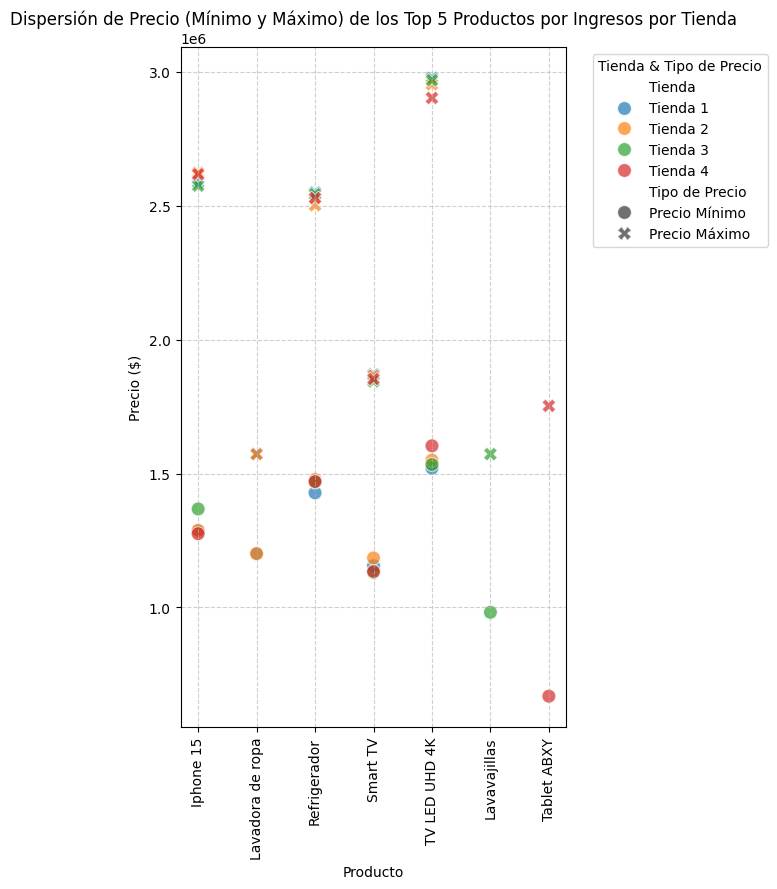

In [37]:

if 'Ingresos' not in all_stores.columns:
    all_stores['Ingresos'] = all_stores['Precio'] + all_stores['Costo de envío']

top_revenue_products_dict = {}

for store_name, store_df in all_stores.groupby('Tienda'):
    product_revenue = store_df.groupby('Producto')['Ingresos'].sum().reset_index()

    top_5_products_list = product_revenue.sort_values(by='Ingresos', ascending=False).head(5)['Producto'].tolist()

    top_revenue_products_dict[store_name] = top_5_products_list



filtered_stores_list = []

for store_name, top_products_list in top_revenue_products_dict.items():
    store_filtered_data = all_stores[
        (all_stores['Tienda'] == store_name) &
        (all_stores['Producto'].isin(top_products_list))
    ].copy()
    filtered_stores_list.append(store_filtered_data)

filtered_stores_for_price_range = pd.concat(filtered_stores_list, ignore_index=True)


price_range_filtered = filtered_stores_for_price_range.groupby(['Tienda', 'Producto'])['Precio'].agg(['min', 'max']).reset_index()

price_range_filtered.rename(columns={'min': 'Precio Mínimo', 'max': 'Precio Máximo'}, inplace=True)


plt.figure(figsize=(8, 9))

melted_price_range = price_range_filtered.melt(
    id_vars=['Tienda', 'Producto'],
    value_vars=['Precio Mínimo', 'Precio Máximo'],
    var_name='Tipo de Precio',
    value_name='Precio'
)


ax = sns.scatterplot(
    data=melted_price_range,
    x='Producto',
    y='Precio',
    hue='Tienda',
    style='Tipo de Precio',
    s=100,
    alpha=0.7
)


plt.xlabel('Producto')
plt.ylabel('Precio ($)')
plt.title('Dispersión de Precio (Mínimo y Máximo) de los Top 5 Productos por Ingresos por Tienda')
plt.xticks(rotation=90, ha='center')
plt.legend(title='Tienda & Tipo de Precio', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout(rect=[0, 0, 0.85, 1])

plt.show()

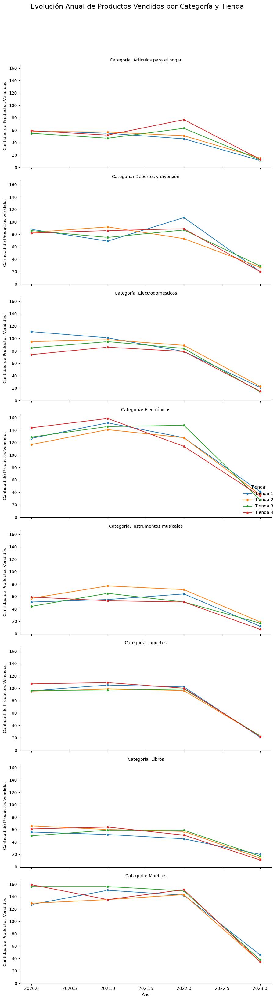

In [34]:
all_stores['Fecha de Compra'] = pd.to_datetime(all_stores['Fecha de Compra'], dayfirst=True, errors='coerce')

all_stores['Año'] = all_stores['Fecha de Compra'].dt.year

productos_vendidos_por_año_tienda_categoria = all_stores.groupby(['Año', 'Tienda', 'Categoría del Producto']).size().reset_index(name='Cantidad Vendida')

g = sns.FacetGrid(productos_vendidos_por_año_tienda_categoria, row='Categoría del Producto', height=4, aspect=2)

g.map(sns.lineplot, 'Año', 'Cantidad Vendida', 'Tienda', marker='o')

g.set_axis_labels("Año", "Cantidad de Productos Vendidos")
g.set_titles("Categoría: {row_name}")
g.fig.suptitle('Evolución Anual de Productos Vendidos por Categoría y Tienda', y=1.02, fontsize=16)

g.add_legend(title='Tienda')

plt.tight_layout(rect=[0, 0, 1, 0.98])

plt.show()

# 5. Envío promedio por tienda

In [32]:
# Agrupa por tienda y calcula el costo de envío promedio
costo_envio_promedio = all_stores.groupby('Tienda')['Costo de envío'].mean()

# Imprime los resultados
print("Costo de envío promedio por tienda:")
for tienda, costo in costo_envio_promedio.items():
    print(f"{tienda}: {costo:.2f}")  # Formatea el costo con dos decimales

Costo de envío promedio por tienda:
Tienda 1: 26018.61
Tienda 2: 25216.24
Tienda 3: 24805.68
Tienda 4: 23459.46


In [28]:
# Agrupar por categoría y tienda, y calcular el costo de envío promedio
shipping_cost_table = all_stores.groupby(['Categoría del Producto', 'Tienda'])['Costo de envío'].mean().reset_index()

shipping_cost_table = shipping_cost_table.pivot(index='Categoría del Producto', columns='Tienda', values='Costo de envío')
print(shipping_cost_table)

Tienda                   Tienda 1  Tienda 2  Tienda 3  Tienda 4
Categoría del Producto                                         
Artículos para el hogar     3,765     4,424     4,590     4,249
Deportes y diversión        7,469     6,827     6,943     6,390
Electrodomésticos          61,936    60,838    62,929    59,144
Electrónicos               51,258    51,692    48,461    48,400
Instrumentos musicales     26,835    24,811    23,214    23,258
Juguetes                    3,023     2,836     3,307     3,291
Libros                      2,699     2,821     2,683     2,891
Muebles                    21,494    21,349    21,611    21,324


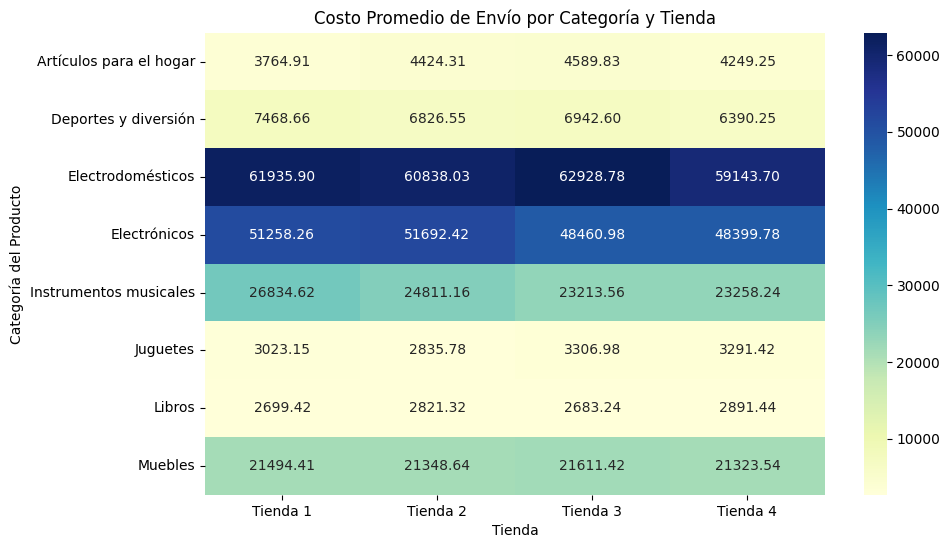

In [29]:

# Crear  mapa de calor
plt.figure(figsize=(10, 6))
sns.heatmap(shipping_cost_table, annot=True, cmap="YlGnBu", fmt=".2f")
plt.title("Costo Promedio de Envío por Categoría y Tienda")
plt.xlabel("Tienda")
plt.ylabel("Categoría del Producto")
plt.show()


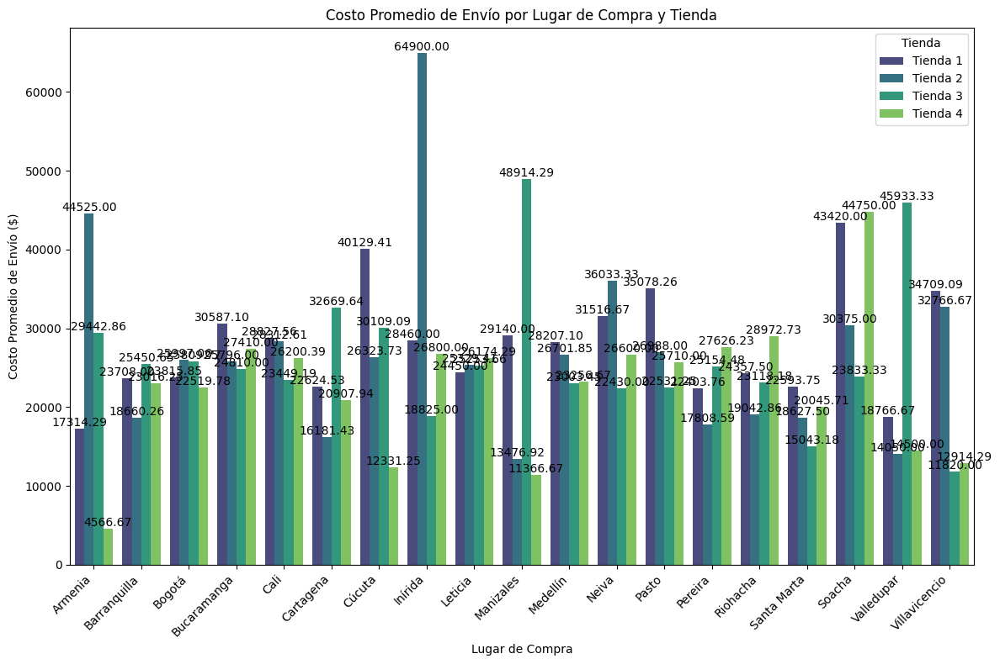

In [38]:
average_shipping_cost_by_location = all_stores.groupby(['Lugar de Compra', 'Tienda'])['Costo de envío'].mean().reset_index()

plt.figure(figsize=(12, 8))

ax = sns.barplot(data=average_shipping_cost_by_location,
                 x='Lugar de Compra',
                 y='Costo de envío',
                 hue='Tienda',
                 palette='viridis')


for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')
plt.xlabel('Lugar de Compra')
plt.ylabel('Costo Promedio de Envío ($)')
plt.title('Costo Promedio de Envío por Lugar de Compra y Tienda')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Tienda')

plt.tight_layout()
plt.show()

# 5. Gráfico de ubicaciones de compras

In [37]:
import folium

# Suponiendo que 'all_stores' tiene columnas 'latitud' y 'longitud'
mapa = folium.Map(location=[all_stores['lat'].mean(), all_stores['lon'].mean()], zoom_start=10)

for index, row in all_stores.iterrows():
    folium.Marker([row['lat'], row['lon']], popup=row['Tienda']).add_to(mapa)

mapa

## INFORME FINAL

##**INTRODUCCIÓN**

El presente informe da cuenta del análisis a las Tiendas de la Cadena Alura Store, dado el interés en vender una de ellas para iniciar un nuevo emprendimiento.
El objetivo central es identificar la tienda menos eficiente.

## **ANALISIS REALIZADO**

Se tomo la data de las ventas de las 4 tiendas que se nos entregaron, la cual contenia los campos: Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,

El informe usa datos del periodo entre enero de 2020 y marzo de 2023.

Los análisis se hicieron en base a:
-Los ingresos totales de las tiendas.
-Las categorías de productos más y menos vendidas.
-Las calificaciones promedio de los clientes por tienda.
-Los productos más y menos vendidos.
-El coste de envío promedio para cada tienda.


###Análisis sobre los ingresos totales de las tiendas:

**Tienda 1 : 1,150,880,400.**

**Tienda 2 : 1,116,343,500.**

**Tienda 3 : 1,098,019,600.**

**Tienda 4 : 1,038,375,700.**

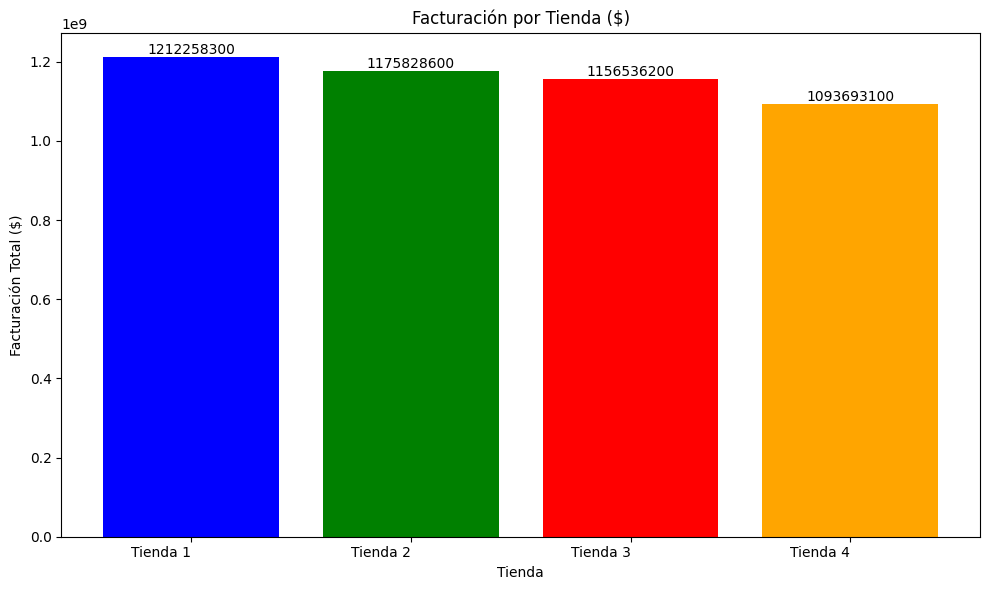


La tienda 4 es la que menos ingresos genera y la Tienda 1 es la que mejores ingresos tiene.

### Análisis sobre las categorías de productos más y menos vendidas:

| Categoría  | $ por Categoría |
|------------------------|-----------------------|
| Artículos para el hogar | 57,579,800            |
| Deportes y diversión    | 142,977,700           |
| Electrodomésticos       | 1,324,751,100         |
| Electrónicos            | 1,660,576,500         |
| Instrumentos musicales  | 348,772,600           |
| Juguetes                | 73,604,400            |
| Libros                  | 37,696,100            |
| Muebles                 | 757,661,000           |

Siendo la Categoría "Electrónicos" y "Electrodomésticos" la más vendida en todas las tiendas y las categorías "Libros" y "Artículos para el hogar los menos vendidos"

**Tienda 1:**

| Ingresos por categoría: | Ingresos|
|-------------------------|------------|
|Electrónicos              |429,493,500|
|Electrodomésticos         |363,685,200|
|Muebles                   |187,633,700|
|Instrumentos musicales    |91,299,000|
|Deportes y diversión      |39,290,000|
|Juguetes                  |17,995,700|
|Artículos para el hogar   |12,698,400|
|Libros                    | 8,784,900|


**Tienda 2:**

Ventas por categoría:

| Ingresos por categoría:  | Ingresos |
|-------------------------|------------|
|Electrónicos             | 410,831,100|
|Electrodomésticos        | 348,567,800|
|Muebles                  | 176,426,300|
|Instrumentos musicales   | 104,990,300|
|Deportes y diversión     |  34,744,500|
|Juguetes                 |  15,945,400|
|Artículos para el hogar  |  14,746,900|
|Libros                   |  10,091,200|


**Tienda 3:**

| Ingresos por categoría:  | Ingresos |
|-------------------------|------------|
|Electrónicos             | 410,775,800|
|Electrodomésticos        | 329,237,900|
|Muebles                  | 201,072,100|
|Instrumentos musicales   |  77,380,900|
|Deportes y diversión     |  35,593,100|
|Juguetes                 | 19,401,100|
|Artículos para el hogar  |  15,060,000|
|Libros                   |   9,498,700|


**Tienda 4:**

| Ingresos por categoría:  | Ingresos |
|-------------------------|------------|
|Electrónicos            |  409,476,100|
|Electrodomésticos       |  283,260,200|
|Muebles                 |  192,528,900|
|Instrumentos musicales  |   75,102,400|
|Deportes y diversión    |   33,350,100|
|Juguetes                |   20,262,200|
|Artículos para el hogar |   15,074,500|
|Libros                  |    9,321,300|


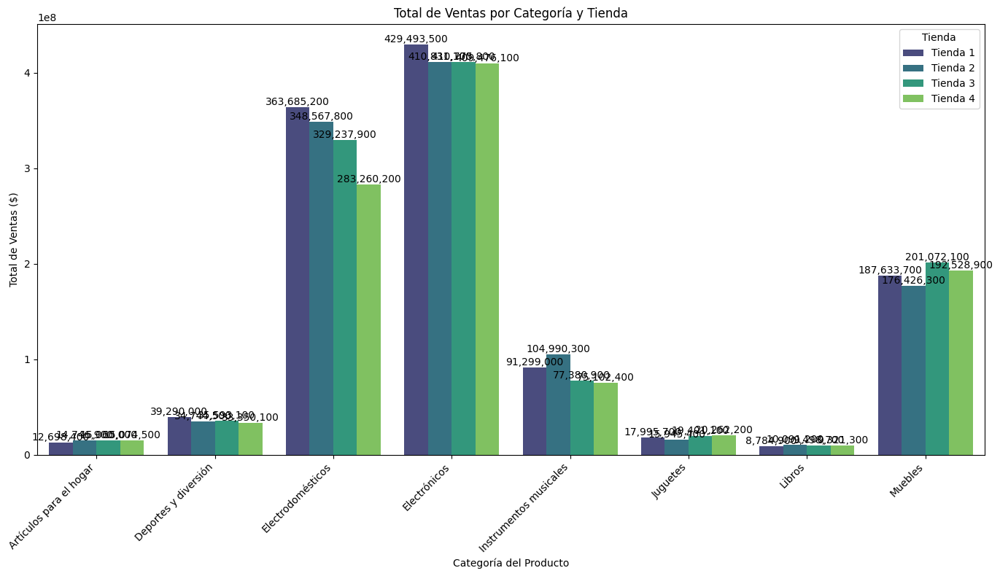


##Análisis   a las calificaciones promedio de los clientes por tienda.

Se hizo un anális comparativo de las calificaciones por tienda y por vendedor. Además se agregó un gráfico de tendencia que permitiera visualziar de mejor manera esta calificación en el tiempo.

grafico tiendas
grafico de tendencias

No se encontraron grandes diferencias entre las tiendas, siendo la tienda 1 la con menor calificación.

Si bien es inferior a 4, no es relevante la diferencia con respecto a las otras tres tiendas, lo que se aprecia en la gráfica de tendencia, que mantiene una tendencia a ajustar estas calificaciones en el tiempo.
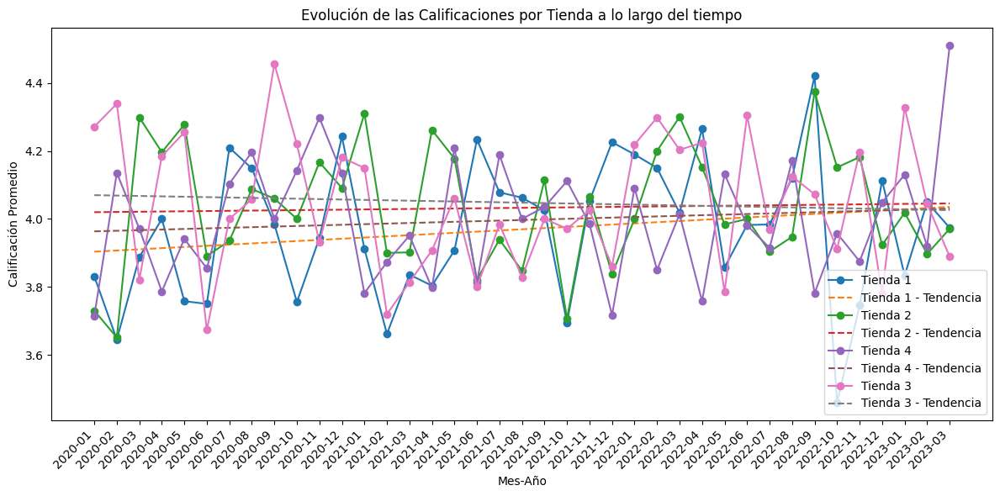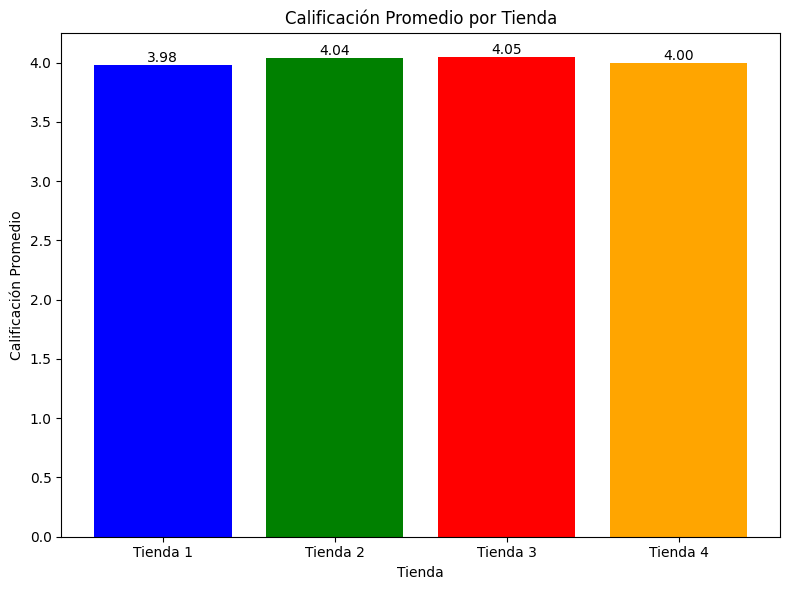

##Análisis sobre los productos más y menos vendidos.

Si miramos este análisis por unidades vendidas tendríamos para:

**Tienda 1:**

Detalle por cantidad de productos más vendidos.

| N° | Nombre del producto | Cantidad Vendida|
|--|---------------------|-----------------|
| 1 |         Armario     |           60|
| 2 |   TV LED UHD 4K     |           60|
| 3 |      Microondas     |           60|
| 4 |Secadora de ropa     |           58|
| 5 |   Mesa de noche     |           56|

Detalle por productos (5) que generan más ingresos:


|N°|      Producto   |  Ingresos
|---|-------------|-----------|
|1  |   TV LED UHD 4K | 142,150,200|
|2  |    Refrigerador | 112,143,300|
|3  |  Iphone 15      | 97,902,200|
|4  |      Smart TV.  |  67,452,100|
|5  |Lavadora de ropa | 65,783,600|


**Tienda 2:**

Detalle por cantidad de productos más vendidos.


| N° | Nombre del producto | Cantidad Vendida|
|----|---------------------|-----------------|   
 |1 | Iniciando en programación    |      65|
 |2 |              Microondas      |      62|
 |3 |                  Batería     |      61|
 |4 |               Pandereta      |      58|
 |5 |       Guitarra acústica      |      58|

Detalle por productos (5) que generan más ingresos:

|N°|       Producto   |  Ingresos
|--|------------------|-----------|
|1  |       Iphone 15 | 113,225,800|
|2  |  TV LED UHD 4K  | 103,375,000|
|3  |    Refrigerador |  97,632,500|
|4  |Lavadora de ropa |  66,762,300|
|5  |        Smart TV |  61,142,000|


**Tienda 3:**

Detalle por cantidad de productos más vendidos.

| N° | Nombre del producto | Cantidad Vendida|
|----|---------------------|-----------------|  
|1 |     Kit de bancas  |              57|
|2  |   Mesa de comedor  |              56|
|3  |         Cama king  |              56|
|4  |      Set de ollas  |              55|
|5  |     Mesa de noche  |              55|


Detalle por productos (5) que generan más ingresos:

|N°|      Producto   |  Ingresos |
|--|-----------------|-----------|
|1 |    Refrigerador |  99,889,700|
|2 |   TV LED UHD 4K |  96,669,100|
|3 |       Iphone 15 |  93,225,700|
|4 |        Smart TV |  78,837,300|
|5 |    Lavavajillas |  64,364,800|

**Tienda 4:**

Detalle por cantidad de productos más vendidos.

| N° | Nombre del producto | Cantidad Vendida|
|----|---------------------|-----------------|  
|1  |                 Cama box      |     62|
|2  |             Cubertería        |     59|
|3  |                Cama king      |     56|
|4  |  Dashboards con Power BI      |     56|
|5  |Carrito de control remoto      |     55|


Detalle por productos (5) que generan más ingresos:



|N°|      Producto   |  Ingresos
|--|-------------|----------------|
|1 |       Iphone 15 |  96,697,500|
|2 |   TV LED UHD 4K |  90,295,300|
|3 |        Smart TV |  82,790,400|
|4 |    Refrigerador |  75,271,900|
|5 |     Tablet ABXY |  56,723,100|



Los productos electrónicos y electrodomesticos son los más vendidos, siendo el TV LED 4K, el Iphone 15y el Refrigerador los productos más vendidos por tiendas.

Pero se puede apreciar que si analizamos los productos con las cantidades más vendidas no son los productos que más ingresos generan, dado que las cantidades más vendidas son por lo general productos más baratos.

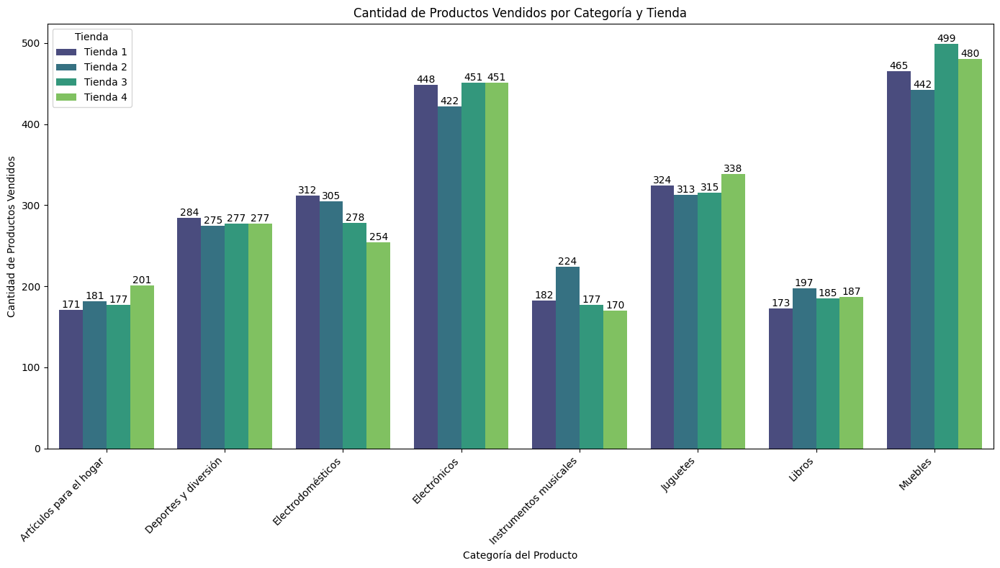


##Análisis sobre el costo de envío promedio para cada tienda.

Se hizo un análisis de costo promedio  por envio de cada tienda por categoría

| Categoría     |    Tienda 1 | Tienda 2 | Tienda 3 | Tienda 4 |
|-----|-------|------|--------|--------|                                         
|Artículos para el hogar  |   3,765  |   4,424 |    4,590  |   4,249
|Deportes y diversión   |     7,469  |   6,827   |  6,943  |   6,390
|Electrodomésticos     |     61,936  |  60,838 |   62,929  |  59,144
|Electrónicos           |    51,258  |  51,692 |   48,461  |  48,400
|Instrumentos musicales |    26,835  |  24,811 |   23,214  |  23,258
|Juguetes               |     3,023 |    2,836 |    3,307  |   3,291
|Libros                 |     2,699  |   2,821  |   2,683  |   2,891
|Muebles              |      21,494  |  21,349  |  21,611  |  21,324


Tomando en cuenta que los costos de los electrónicos y electrodomésticos son los que tienen los costos más caros, se puede apreciar que la tienda 3 tiene los costos de envío más caros y la tienda 4 los costos más baratos.
En los electrónicos la tienda 2 tiene los costos más caros y la tienda 4 los más baratos por estrecho margen con la tienda 3.

Considerando esto, los costos de envio tiene diferenciales marginales sobre el envío de mismo productos, no son tan relevantes en las diferencias salvo si comparamos la tienda 4 y la tienda 1 que venden productos en las mismas zonas. Ahi se nota la diferencia por mínima que sea.
No hay mayor información para determinar porque ocurren estos costos superiores en envío, podría suponer que el costo de negociación de envío lo hace cada tienda, o si es centralziado podría deberse a la distancia de entrega.

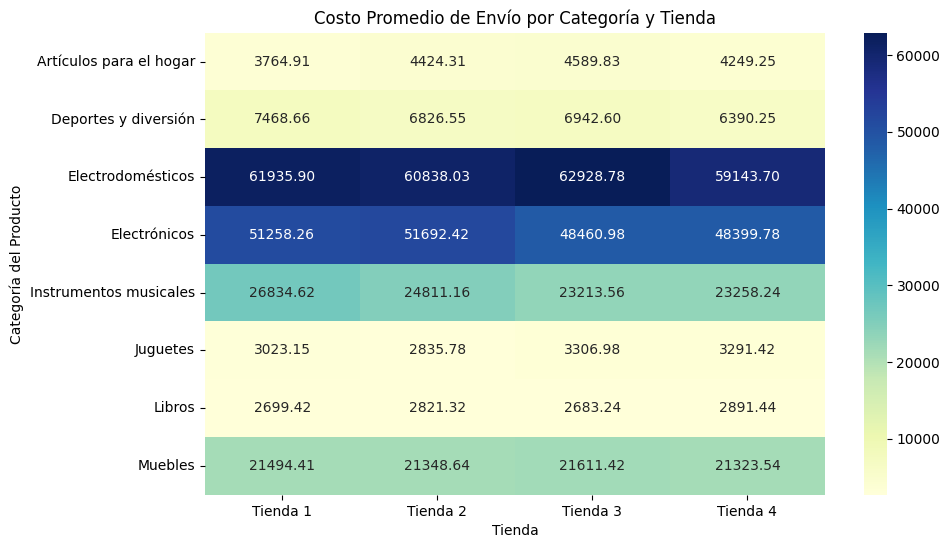

##CONCLUSIÓN

Los productos más vendidos en unidades no son los productos que generan más ingresos. Falta más información como para determinar otros factores que permitan por ejemplo saber si hay costos de almacenaje involucrados, que podrían hacer suponer que los productos más vendidos como electrodomésticos o electrónicos necesitan un espacio mayor y por ello tienen un costo mayor.
Con la información dada no se puede hacer un análisis de ese tipo que podría haber determinado otro tipo de variables para analizar mejor.

Lo mismo, por ejemplo si el traslado de un producto de una determinada tienda, porque se asume que sale de la tienda que lo vendió, cuando en realidad podríamos supner que se envía de un centro de abastecimiento y desde ahi se toma el costo de envío. Con esta info se podría determinar de mejor manera el costo de envio de manera mas certera.

Se podría evaluar con mayor información si las distancias o la negociación de tarifas puede hacer que los costos sean similares y eficientes cuando salgan a despacho, independiente de la venta de la tienda.

Por otro lado la diferencia de precios de los mismos productos vendidos en diferentes tiendas, explica el aumento de los ingresos en una u otra.

No se visualiza a primera vista una explicación coherente sobre el valor diferente del mismo producto en distintas Tiendas, puede ser por el costo de poner el producto en la tienda desde la fabrica (o distribución central) o una política de precios diferenciada para cada Tienda.

Si bien el análisis tiene temas pendientes explicados anteriormente, se puede concluir que la tienda 1 y 4 podrían fusionarse o eliminar la tienda 4, que tiene menos ingresos, menos calificación y una menor variación de precios de los mismos productos que generan mayores ingresos.

Nota:
Sólo se han agregado al informe los gráficos principales.
Los demás se encuentran en el análisis previo.